In [1]:
import os
import tensorflow as tf

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ['CUDA_VISIBLE_DEVICES'] = "0"
gpus = tf.config.experimental.list_physical_devices("GPU")
print(gpus)
if len(gpus) > 0:
    tf.config.experimental.set_memory_growth(gpus[0], True)
else:  print('working on CPU')

import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io import wavfile
!pip install python_speech_features
from python_speech_features import mfcc, logfbank


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
  Created wheel for python-speech-features: filename=python_speech_features-0.6-cp37-none-any.whl size=5888 sha256=70ba4373f129d60a61b8ab1a475792e56b34b561dc14c113fdf8362ad2df846d
  Stored in directory: /root/.cache/pip/wheels/3c/42/7c/f60e9d1b40015cd69b213ad90f7c18a9264cd745b9888134be
Successfully built python-speech-features


In [3]:
from glob import glob
base = '/content/drive/MyDrive/PodCastle/keywords2'
for end in ['no', 'noise', 'unknown', 'yes']:
  print(len(glob(os.path.join(base, end)+ '/*')))

1500
1536
1500
1500


In [3]:
import seaborn as sns
import tensorflow as tf

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras import layers
from tensorflow.keras import models
from IPython import display


# Set seed for experiment reproducibility
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

## Simple Features

In [4]:
import os
from glob import glob
audios = [x for x in glob(base + '/*/*') if 'MACOSX' not in x] # '/content/drive/MyDrive/Krisp_project/Task1_signal-processing/*'
len(audios)

6036

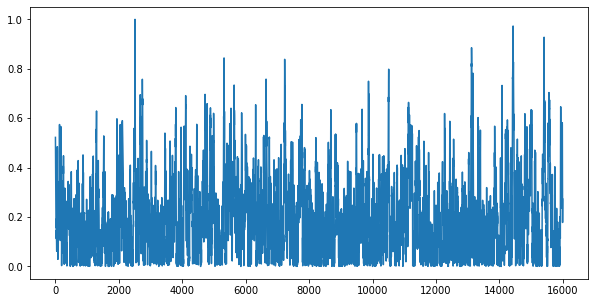

In [5]:
sample = audios[0]
signal, rate = librosa.load(sample, sr = 16000)
audio_rectified = pd.Series(signal).apply(np.abs)
audio_rectified.plot(figsize=(10, 5))
plt.show()

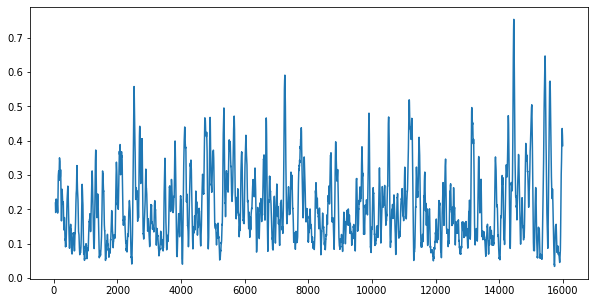

In [6]:
# Smooth by applying a rolling mean
audio_rectified_smooth = audio_rectified.rolling(50).mean()
audio_rectified_smooth.plot(figsize=(10, 5))
plt.show()

In [7]:
# Calculate stats
means = np.mean(audio_rectified_smooth, axis=0)
stds = np.std(audio_rectified_smooth, axis=0)
maxs = np.max(audio_rectified_smooth, axis=0)

# Create the X and y arrays
np.column_stack([means, stds, maxs])

array([[0.2058781 , 0.10664153, 0.7536499 ]])

In [ ]:
# Calculate the tempo of the sounds
tempos = []
for col, i_audio in audios:
    tempos.append(lr.beat.tempo(i_audio.values, sr=sfreq, hop_length=2**8, aggregate=None))

# Convert the list to an array so you can manipulate it more easily
tempos = np.array(tempos)

# Calculate statistics of each tempo
tempos_mean = tempos.mean(axis=-1)
tempos_std = tempos.std(axis=-1)
tempos_max = tempos.max(axis=-1)

In [12]:
def get_label(file_path):
  parts = tf.strings.split(file_path, os.path.sep)

  # Note: You'll use indexing here instead of tuple unpacking to enable this 
  # to work in a TensorFlow graph.
  return parts[-2]

In [13]:
df = pd.DataFrame(np.zeros((len(audios), 4)), columns = ['Mean', 'Std', 'Max', 'Label'])
from tqdm import tqdm
for i, sample in tqdm(enumerate(audios)):
  signal, rate = librosa.load(sample, sr = 16000)
  #tempo = librosa.beat.tempo(signal, sr=rate, hop_length=2**6, aggregate=None)
  label = get_label(sample)
  label = label.numpy().decode('utf-8')
  audio_rectified = pd.Series(signal).apply(np.abs)
  means = np.mean(audio_rectified_smooth, axis=0)
  stds = np.std(audio_rectified_smooth, axis=0)
  maxs = np.max(audio_rectified_smooth, axis=0)
  df.iloc[i, :] = np.column_stack([means, stds, maxs, label])

6036it [24:46,  4.06it/s]


In [20]:
from sklearn.ensemble import RandomForestClassifier as RF
import sklearn
model = RF(150, max_depth = 24, criterion = 'entropy')
df = df.iloc[1:,:]  # first row is 'corrupted'
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(df.iloc[:, :-1], df.Label, random_state = 42, test_size = .1)
print(X_train.shape, X_test.shape)
model.fit(X_train, y_train)
model.score(X_test, y_test)

(5431, 3) (604, 3)


0.21688741721854304

## Advanced Features

In [4]:
def decode_audio(audio_binary):
  audio, _ = tf.audio.decode_wav(audio_binary)
  return tf.squeeze(audio, axis=-1)

In [5]:
def get_label(file_path):
    parts = tf.strings.split(file_path, os.path.sep)
    return parts[-2]  # working with tensorflow graph

In [ ]:
def get_waveform_and_label(file_path):
  label = get_label(file_path)
  audio_binary = tf.io.read_file(file_path)
  waveform = decode_audio(audio_binary)
  return waveform, label

In [ ]:
import os
from glob import glob
audios = [x for x in glob(base + '/*/*') if 'MACOSX' not in x] # '/content/drive/MyDrive/Krisp_project/Task1_signal-processing/*'
len(audios)

6036

In [ ]:
data_dir = base + '/*/*'
filenames = tf.io.gfile.glob(data_dir)
filenames = tf.random.shuffle(filenames)
num_samples = len(filenames)
print('Number of total examples:', num_samples)
print('Example file tensor:', filenames[1530])

Number of total examples: 6036
Example file tensor: tf.Tensor(b'/content/drive/MyDrive/PodCastle/keywords2/no/no.56f8a100_nohash_1.wav', shape=(), dtype=string)


In [ ]:
from sklearn.model_selection import train_test_split as split 
train_files, val_files = split(filenames.numpy(), test_size = .1, random_state = 42)
train_files, test_files = split(train, test_size = .1, random_state = 42)
len(train_files), len(val_files), len(test_files), len(filenames)

(4399, 604, 489, 6036)

In [ ]:
train_files = filenames[:4500]
val_files = filenames[4500: 5400]
test_files = filenames[-600:]


print('Training set size', len(train_files))
print('Validation set size', len(val_files))
print('Test set size', len(test_files))

Training set size 4500
Validation set size 900
Test set size 600


In [ ]:
remove = []  # tf.Tensor(b'/content/drive/MyDrive/PodCastle/keywords2/no/no.10467b06_nohash_0.wav', shape=(), dtype=string)
from tqdm import tqdm
for i, x in enumerate(tqdm(train_files)):
  if i % (len(train_files)//4) == 0: print(i)
  try:
    a, l = get_waveform_and_label(x)
  except:
    remove.append(x)
    print(x)

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
files_ds = tf.data.Dataset.from_tensor_slices(train_files)
waveform_ds = files_ds.map(get_waveform_and_label, num_parallel_calls=AUTOTUNE)

In [23]:
def get_spectrogram(waveform):
  # Padding for files with less than 16000 samples
  zero_padding = tf.zeros([16000] - tf.shape(waveform), dtype=tf.float32)

  # Concatenate audio with padding so that all audio clips will be of the 
  # same length
  waveform = tf.cast(waveform, tf.float32)
  equal_length = tf.concat([waveform, zero_padding], 0)
  spectrogram = tf.signal.stft(
      equal_length, frame_length=256, frame_step=128)
  
  spectrogram = tf.abs(spectrogram)

  return spectrogram

In [ ]:
for waveform, label in waveform_ds.take(1):
  label = label.numpy().decode('utf-8')
  spectrogram = get_spectrogram(waveform)

print('Label:', label)
print('Waveform shape:', waveform.shape)
print('Spectrogram shape:', spectrogram.shape)
print('Audio playback')
from IPython import display
display.display(display.Audio(waveform, rate=16000))

Label: noise
Waveform shape: (16000,)
Spectrogram shape: (124, 129)
Audio playback


In [19]:
s,r = librosa.load(target, 16000)
h = pd.DataFrame(np.zeros((1,16001)))
h.iloc[0,1:] = s
h.to_csv('track.csv', index = False)

In [29]:
import pandas as pd
import numpy as np
import librosa
target = '/content/drive/MyDrive/PodCastle/keywords2/yes/yes.0a196374_nohash_4.wav' #'/content/drive/MyDrive/PodCastle/keywords2/unknown/unknown.0a9f9af7_nohash_0.wav'
#df = pd.DataFrame(np.array([0, [3, 4]])), columns = ['Tracker', 'Signal'])
#print(df)
s,r = librosa.load(target, 16000)
#df.iloc[0, 1] = s
#df.to_csv('track.csv', index = False)


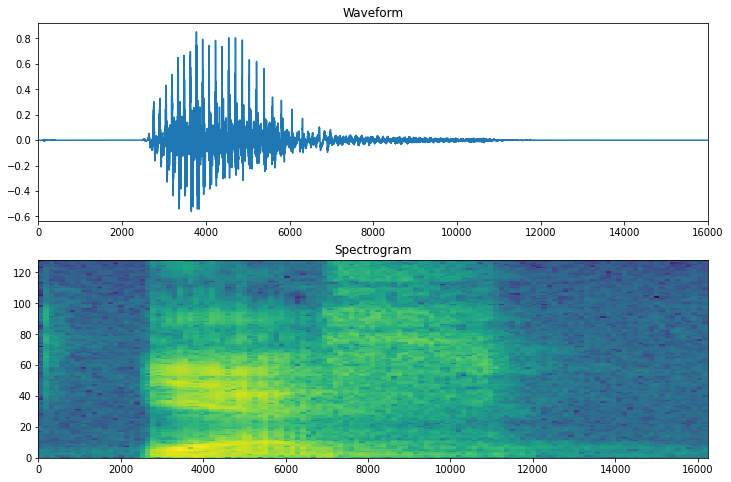

In [36]:
def plot_spectrogram(spectrogram, ax):
  # Convert to frequencies to log scale and transpose so that the time is
  # represented in the x-axis (columns).
  log_spec = np.log(spectrogram.T)
  height = log_spec.shape[0]
  width = log_spec.shape[1]
  X = np.linspace(0, np.size(spectrogram), num=width, dtype=int)
  Y = range(height)
  ax.pcolormesh(X, Y, log_spec)

import matplotlib.pyplot as plt
fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, s)
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 16000])
plot_spectrogram(np.abs(spec).T, axes[1])
axes[1].set_title('Spectrogram')
plt.show()

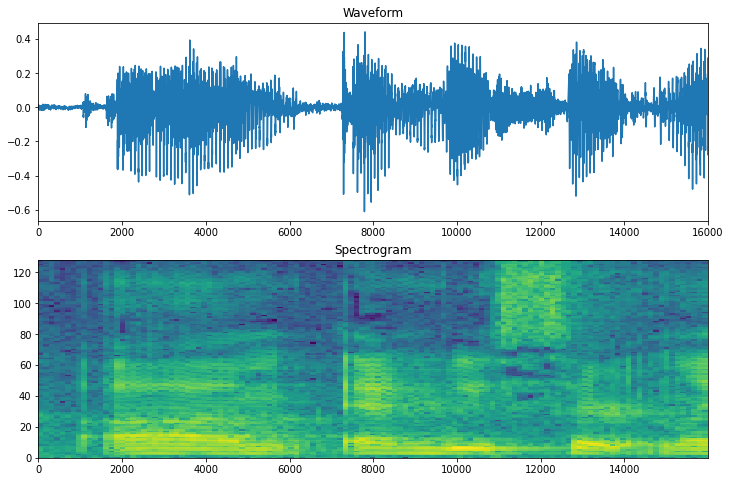

In [ ]:
def plot_spectrogram(spectrogram, ax):
  # Convert to frequencies to log scale and transpose so that the time is
  # represented in the x-axis (columns).
  log_spec = np.log(spectrogram.T)
  height = log_spec.shape[0]
  width = log_spec.shape[1]
  X = np.linspace(0, np.size(spectrogram), num=width, dtype=int)
  Y = range(height)
  ax.pcolormesh(X, Y, log_spec)


fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform.numpy())
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 16000])
plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
plt.show()

In [ ]:
labels = ['no' , 'noise', 'unknown', 'yes']
def get_spectrogram_and_label_id(audio, label):
  spectrogram = get_spectrogram(audio)
  spectrogram = tf.expand_dims(spectrogram, -1)
  label_id = tf.argmax(label == labels)
  return spectrogram, label_id
spectrogram_ds = waveform_ds.map(
    get_spectrogram_and_label_id, num_parallel_calls=AUTOTUNE)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


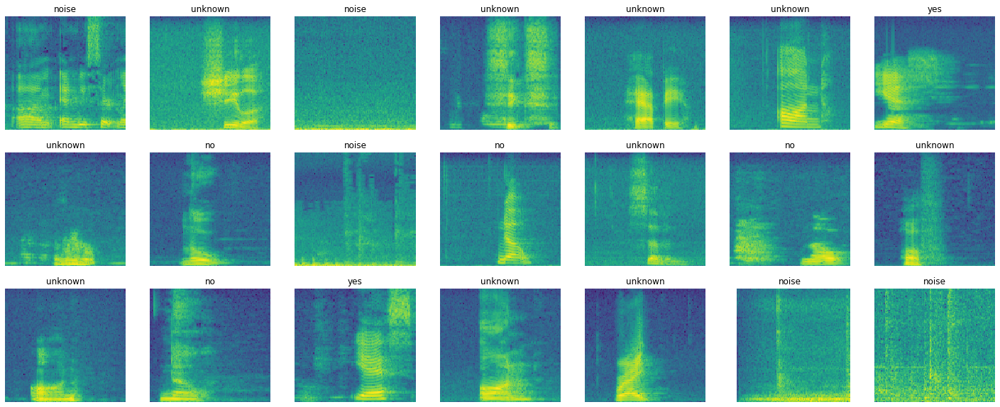

In [ ]:
def visualise_spectogram_data(rows, cols):
  n = rows*cols
  fig, axes = plt.subplots(rows, cols, figsize=(25, 10))
  for i, (spectrogram, label_id) in enumerate(spectrogram_ds.take(n)):
    r = i // cols
    c = i % cols
    ax = axes[r][c]
    plot_spectrogram(np.squeeze(spectrogram.numpy()), ax)
    ax.set_title(commands[label_id.numpy()])
    ax.axis('off')

  plt.show()

visualise_spectogram_data(3, 7)

In [ ]:
def preprocess_dataset(files):
  files_ds = tf.data.Dataset.from_tensor_slices(files)
  output_ds = files_ds.map(get_waveform_and_label, num_parallel_calls=AUTOTUNE)
  output_ds = output_ds.map(
      get_spectrogram_and_label_id,  num_parallel_calls=AUTOTUNE)
  return output_ds

In [ ]:
train_ds = spectrogram_ds
val_ds = preprocess_dataset(val_files)
test_ds = preprocess_dataset(test_files)

In [ ]:
val_audio = []
val_labels = []
for audio, label in tqdm(val_ds):
  val_audio.append(audio.numpy())
  val_labels.append(label.numpy())

val_audio = np.array(val_audio)
val_labels = np.array(val_labels)

100%|██████████| 604/604 [00:03<00:00, 166.62it/s]


In [ ]:
batch_size = 64
#train_ds = train_ds.shuffle(1024, reshuffle_each_iteration=True)
train_d = train_ds.batch(batch_size)
#train_ds = train_ds.repeat()
val_d = val_ds.batch(batch_size)

In [ ]:
train_d = train_d.cache().prefetch(AUTOTUNE)
val_d = val_d.cache().prefetch(AUTOTUNE)

## Model Building

In [ ]:
for spectrogram, _ in spectrogram_ds.take(1):
  input_shape = spectrogram.shape
print('Input shape:', input_shape)
num_labels = len(labels)

Input shape: (124, 129, 1)


In [ ]:
from tensorflow.keras import layers, models
model = models.Sequential([
    layers.Input(shape=[124, 129, 1]),
    # """
    # layers.Conv2D(32, 5, strides = 2, activation='relu'),
    # layers.Conv2D(32, 3, strides = 2, activation='relu'),
    # layers.BatchNormalization(),
    # layers.MaxPool2D(),
    # preprocessing.Resizing(32, 32),
    # """ 
    #preprocessing.Resizing(32, 32)
    layers.Conv2D(32, 5, strides = 2),
    layers.Lambda(lambda x: tf.abs(x)),
    layers.BatchNormalization(),
    layers.ReLU(),
    layers.MaxPool2D(),
    layers.Conv2D(64, (3,3), activation='selu'),
    layers.Conv2D(64, (3,3), activation = 'selu'),
    layers.Conv2D(64, (3,3)),
    layers.BatchNormalization(),
    layers.ReLU(),
    layers.MaxPooling2D(),
    layers.Dropout(0.35),
    layers.Flatten(),
    layers.Dense(128, activation='selu'),
    layers.Dropout(0.4),
    layers.Dense(num_labels, 'softmax'),
])

model.summary()

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_54 (Conv2D)           (None, 60, 63, 32)        832       
_________________________________________________________________
lambda_2 (Lambda)            (None, 60, 63, 32)        0         
_________________________________________________________________
batch_normalization_19 (Batc (None, 60, 63, 32)        128       
_________________________________________________________________
re_lu_12 (ReLU)              (None, 60, 63, 32)        0         
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 30, 31, 32)        0         
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 28, 29, 64)        18496     
_________________________________________________________________
conv2d_56 (Conv2D)           (None, 26, 27, 64)      

In [ ]:
update_log()
display_callback = DisplayCallback(model, freq = 3)
# concatenate all callbacks
callbacks_list = [lr_scheduler_callback, tensorboard_callback, early_stopping_callback, checkpoint_callback, display_callback]
print(log_dir)

logs/fit/VGG16-GPU_1623623023.5821216


Epoch 1/20
69/69 [==============================] - 29s 400ms/step - loss: 1.8651 - accuracy: 0.5451 - val_loss: 1.0523 - val_accuracy: 0.6159
Validation set accuracy: 62%


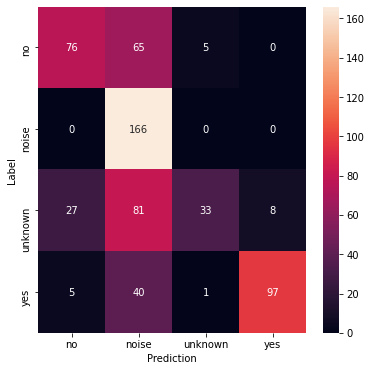

Epoch 2/20
69/69 [==============================] - 2s 34ms/step - loss: 0.9209 - accuracy: 0.7031 - val_loss: 2.9922 - val_accuracy: 0.4123
Epoch 3/20
69/69 [==============================] - 2s 33ms/step - loss: 0.6827 - accuracy: 0.7809 - val_loss: 3.5291 - val_accuracy: 0.3460
Epoch 4/20
69/69 [==============================] - 2s 33ms/step - loss: 0.4950 - accuracy: 0.8395 - val_loss: 3.1695 - val_accuracy: 0.4123
Validation set accuracy: 41%


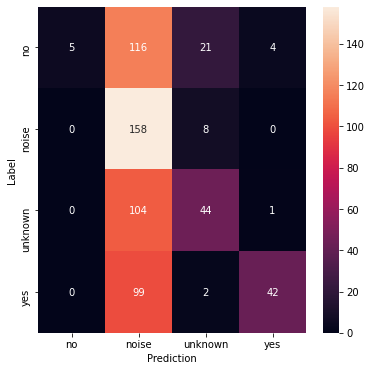

Epoch 5/20
69/69 [==============================] - 2s 33ms/step - loss: 0.4312 - accuracy: 0.8672 - val_loss: 2.9695 - val_accuracy: 0.4321
Epoch 6/20
69/69 [==============================] - 2s 32ms/step - loss: 0.3298 - accuracy: 0.8897 - val_loss: 0.6303 - val_accuracy: 0.7848
Epoch 7/20
69/69 [==============================] - 2s 33ms/step - loss: 0.2844 - accuracy: 0.9084 - val_loss: 0.3253 - val_accuracy: 0.8825
Validation set accuracy: 88%


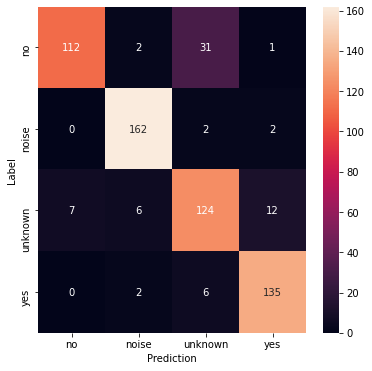

Epoch 8/20
69/69 [==============================] - 2s 33ms/step - loss: 0.2572 - accuracy: 0.9138 - val_loss: 0.3512 - val_accuracy: 0.8974
Epoch 9/20
69/69 [==============================] - 2s 33ms/step - loss: 0.2207 - accuracy: 0.9268 - val_loss: 0.3206 - val_accuracy: 0.8940
Epoch 10/20
69/69 [==============================] - 2s 33ms/step - loss: 0.1887 - accuracy: 0.9348 - val_loss: 0.3169 - val_accuracy: 0.9007
Validation set accuracy: 90%


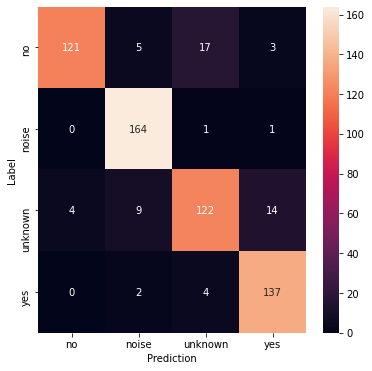

Epoch 11/20
69/69 [==============================] - 2s 33ms/step - loss: 0.1620 - accuracy: 0.9439 - val_loss: 0.3346 - val_accuracy: 0.9023
Epoch 12/20
69/69 [==============================] - 2s 33ms/step - loss: 0.1289 - accuracy: 0.9534 - val_loss: 0.2307 - val_accuracy: 0.9238
Epoch 13/20
69/69 [==============================] - 2s 33ms/step - loss: 0.1062 - accuracy: 0.9618 - val_loss: 0.2131 - val_accuracy: 0.9272
Validation set accuracy: 93%


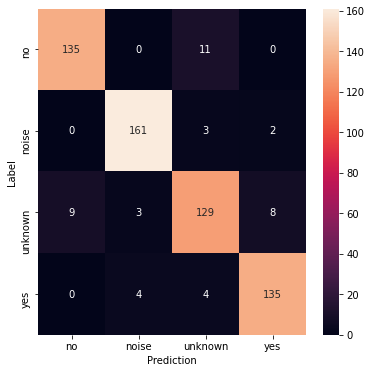

Epoch 14/20
69/69 [==============================] - 2s 33ms/step - loss: 0.0868 - accuracy: 0.9700 - val_loss: 0.2654 - val_accuracy: 0.9255
Epoch 15/20
69/69 [==============================] - 2s 33ms/step - loss: 0.0761 - accuracy: 0.9727 - val_loss: 0.2321 - val_accuracy: 0.9338
Epoch 16/20
69/69 [==============================] - 2s 33ms/step - loss: 0.0884 - accuracy: 0.9716 - val_loss: 0.1934 - val_accuracy: 0.9255
Validation set accuracy: 93%


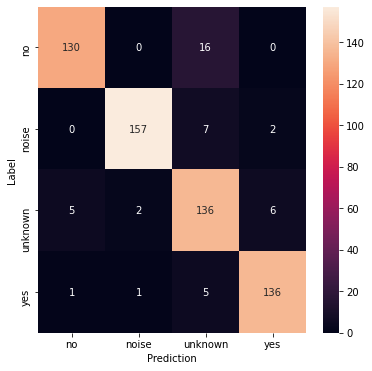

Epoch 17/20
69/69 [==============================] - 2s 33ms/step - loss: 0.0697 - accuracy: 0.9757 - val_loss: 0.2199 - val_accuracy: 0.9321
Epoch 18/20
69/69 [==============================] - 2s 32ms/step - loss: 0.0630 - accuracy: 0.9784 - val_loss: 0.1827 - val_accuracy: 0.9404
Epoch 19/20
69/69 [==============================] - 2s 32ms/step - loss: 0.0557 - accuracy: 0.9807 - val_loss: 0.1918 - val_accuracy: 0.9387
Validation set accuracy: 94%


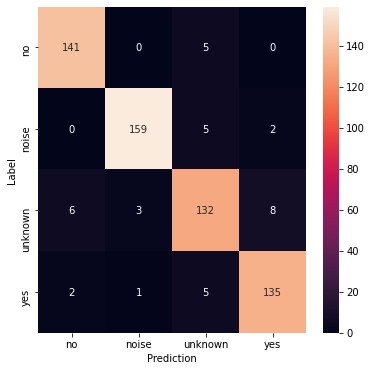

Epoch 20/20
69/69 [==============================] - 2s 33ms/step - loss: 0.0499 - accuracy: 0.9834 - val_loss: 0.2259 - val_accuracy: 0.9354


In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

EPOCHS = 20
history = model.fit( 
    train_d, 
    validation_data=val_d,  
    epochs=EPOCHS,
    callbacks = callbacks_list
)

Test set accuracy: 97%


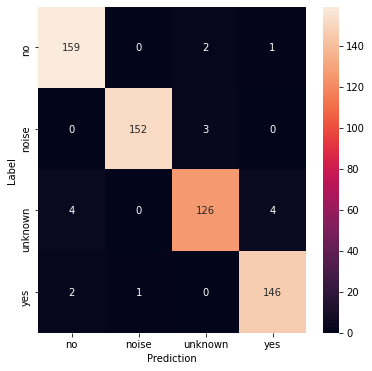

In [ ]:
y_pred = np.argmax(model.predict(test_audio), axis=1)
y_true = test_labels

test_acc = sum(y_pred == y_true) / len(y_true)
print(f'Test set accuracy: {test_acc:.0%}')
conf_matr(y_true, y_pred)

In [ ]:
def model_save(model = model, name = 'custom_model', way = 'pickle'):
  if way != 'pickle':
    model.save('/content/drive/MyDrive/PodCastle/' + name + '.h5')
  else:
    model_json = model.to_json()
    with open("/content/drive/MyDrive/PodCastle/" + name + '.json', "w") as json_file:
        json_file.write(model_json)
    # serialize weights to HDF5
    model.save_weights("/content/drive/MyDrive/PodCastle/" + name + '.h5')
    print("Saved model to disk")

model_save(model, 'custom_enhanced')

Saved model to disk


# New approach

In [ ]:
inputs = layers.Input(shape = (124, 129, 1))
# x = layers.UpSampling2D(size = (2,2))(inputs)
# x = layers.Cropping2D(cropping=((12, 0), (22, 0)))(x)
# x = layers.Conv2D(3, 5)(x)
# x = layers.Conv2D(3, 5)(x)
# x = layers.Conv2D(3, 5)(x)
x = layers.Conv2D(3, 3)(inputs)
x = preprocessing.Resizing(224, 224, interpolation="bilinear")(x)
model = tf.keras.models.Model(inputs, x)
model.summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        [(None, 124, 129, 1)]     0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 122, 127, 3)       30        
_________________________________________________________________
resizing_1 (Resizing)        (None, 224, 224, 3)       0         
Total params: 30
Trainable params: 30
Non-trainable params: 0
_________________________________________________________________


In [ ]:
from tensorflow.keras.applications import VGG16
base = VGG16(include_top = False, weights = 'imagenet', input_shape = (224, 224, 3))
base.trainable = False

net = tf.keras.models.Sequential()
# add a global spatial average pooling layer
net.add(model)
net.add(base)
net.add(layers.GlobalAveragePooling2D())
net.add(layers.Dense(256,activation='selu'))
net.add(layers.Dropout(.4))
net.add(layers.Dense(4,activation='softmax'))
net.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_8 (Functional)         (None, 224, 224, 3)       30        
_________________________________________________________________
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 512)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 256)               131328    
_________________________________________________________________
dropout_11 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 4)                 1028      
Total params: 14,847,074
Trainable params: 132,386
Non-trainable params: 14,714,688
____________________________________

In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

In [ ]:
EPOCHS = 10
history = model.fit( 
    train_ds, 
    validation_data=val_ds,  
    epochs=EPOCHS
)

Epoch 1/10
71/71 [==============================] - 620s 9s/step - loss: 1.0239 - accuracy: 0.6331 - val_loss: 1.5575 - val_accuracy: 0.3389
Epoch 2/10
71/71 [==============================] - 2s 31ms/step - loss: 0.5106 - accuracy: 0.8227 - val_loss: 1.8973 - val_accuracy: 0.3911
Epoch 3/10
71/71 [==============================] - 2s 29ms/step - loss: 0.3744 - accuracy: 0.8744 - val_loss: 0.9459 - val_accuracy: 0.6133
Epoch 4/10
71/71 [==============================] - 2s 29ms/step - loss: 0.2842 - accuracy: 0.9038 - val_loss: 0.3568 - val_accuracy: 0.8833
Epoch 5/10
71/71 [==============================] - 2s 30ms/step - loss: 0.2380 - accuracy: 0.9211 - val_loss: 0.3061 - val_accuracy: 0.9100
Epoch 6/10
71/71 [==============================] - 2s 29ms/step - loss: 0.1952 - accuracy: 0.9329 - val_loss: 0.2778 - val_accuracy: 0.9122
Epoch 7/10
71/71 [==============================] - 2s 30ms/step - loss: 0.1675 - accuracy: 0.9424 - val_loss: 0.2530 - val_accuracy: 0.9178
Epoch 8/10
71

In [ ]:
test_audio = []
test_labels = []

from tqdm import tqdm
for audio, label in tqdm(test_ds):
  test_audio.append(audio.numpy())
  test_labels.append(label.numpy())

test_audio = np.array(test_audio)
test_labels = np.array(test_labels)

100%|██████████| 600/600 [02:21<00:00,  4.23it/s]


In [ ]:
test_audio[0].shape

(124, 129, 1)

In [ ]:
y_pred = np.argmax(model.predict(test_audio), axis=1)
y_true = test_labels

test_acc = sum(y_pred == y_true) / len(y_true)
print(f'Test set accuracy: {test_acc:.0%}')

Test set accuracy: 94%


In [ ]:
def model_save(name, way = pickle):
  #model.save('/content/drive/MyDrive/PodCastle/custom_model.h5')
  model_json = model.to_json()
  with open("/content/drive/MyDrive/PodCastle/" + name + '.json', "w") as json_file:
      json_file.write(model_json)
  # serialize weights to HDF5
  model.save_weights("/content/drive/MyDrive/PodCastle/" + name + '.h5')
  print("Saved model to disk")

model_save('custom_model')

Saved model to disk


### Callbacks

In [ ]:
def conf_matr(y_true, y_pred):
  confusion_mtx = tf.math.confusion_matrix(y_true, y_pred) 
  plt.figure(figsize=(6,6))
  sns.heatmap(confusion_mtx, xticklabels=commands, yticklabels=commands, 
              annot=True, fmt='g')
  plt.xlabel('Prediction')
  plt.ylabel('Label')
  plt.show()

In [ ]:
y_pred = np.argmax(net.predict(val_audio), axis=1)
y_true = val_labels

test_acc = sum(y_pred == y_true) / len(y_true)
print(f'Validation set accuracy: {test_acc:.0%}')

Validation set accuracy: 86%


In [ ]:
class DisplayCallback(tf.keras.callbacks.Callback):  # visualise during training from manually downlaoded images
    def __init__(self, net, freq = 1):
        super(DisplayCallback, self).__init__()
        self.net = net
        self.freq = freq
  
    def on_epoch_end(self, epoch, logs=None):
            import warnings, sys
            warnings.filterwarnings("ignore")
            if not sys.warnoptions:
                warnings.simplefilter("ignore")

            if epoch % self.freq == 0:
              model = self.net
              
              y_pred = np.argmax(model.predict(val_audio), axis=1)
              y_true = val_labels

              test_acc = sum(y_pred == y_true) / len(y_true)
              print(f'Validation set accuracy: {test_acc:.0%}')

              conf_matr(y_true, y_pred)

In [ ]:
import tensorflow as tf
import keras
import time, datetime
%load_ext tensorboard

# update ing model directories for tensorboard
def update_log():
  global name, log_dir
  
  name = "VGG16-GPU_{}".format(time.time())
  log_dir = "logs/fit/" + name

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
update_log()

# define rule for updating learning rates
def scheduler(epoch, lr):
  if epoch < 8: return lr
  else: return lr * tf.math.exp(-0.1)

lr_scheduler_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1, update_freq='epoch')
#early stop if some criteria takes place
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=  5, verbose=0, # min_delta=0.005
    restore_best_weights= True
)
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint( 
    filepath = '/content/drive/MyDrive/PodCastle/VGG16-GPU_weights.hdf5',
    save_best_only = True,
    mode = 'auto'
)
display_callback = DisplayCallback(net)
# concatenate all callbacks
callbacks_list = [lr_scheduler_callback, tensorboard_callback, early_stopping_callback, checkpoint_callback, display_callback]
print(log_dir)

logs/fit/VGG16-GPU_1623621125.8778043


### Transfer Learning

Epoch 1/15
71/71 [==============================] - 75s 1s/step - loss: 0.3729 - accuracy: 0.8711 - val_loss: 0.3802 - val_accuracy: 0.8644
Validation set accuracy: 86%


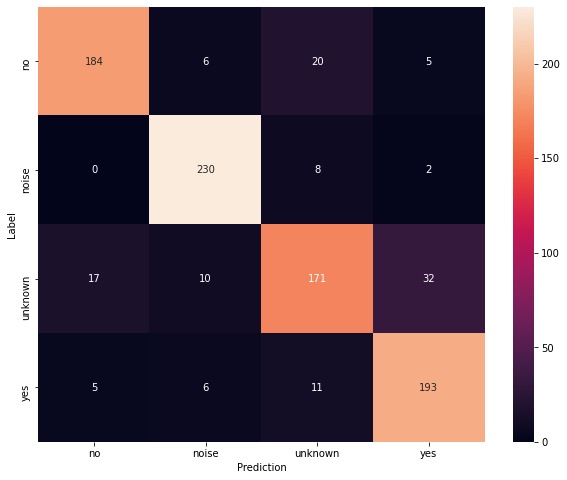

Epoch 2/15
71/71 [==============================] - 74s 1s/step - loss: 0.3666 - accuracy: 0.8767 - val_loss: 0.3773 - val_accuracy: 0.8656
Validation set accuracy: 87%


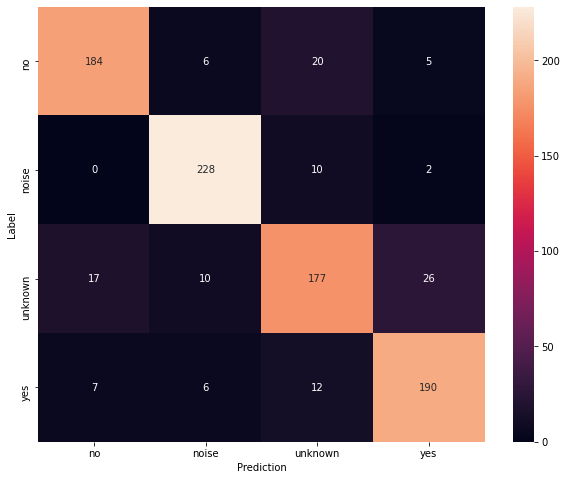

Epoch 3/15
71/71 [==============================] - 74s 1s/step - loss: 0.3630 - accuracy: 0.8782 - val_loss: 0.3758 - val_accuracy: 0.8656
Validation set accuracy: 87%


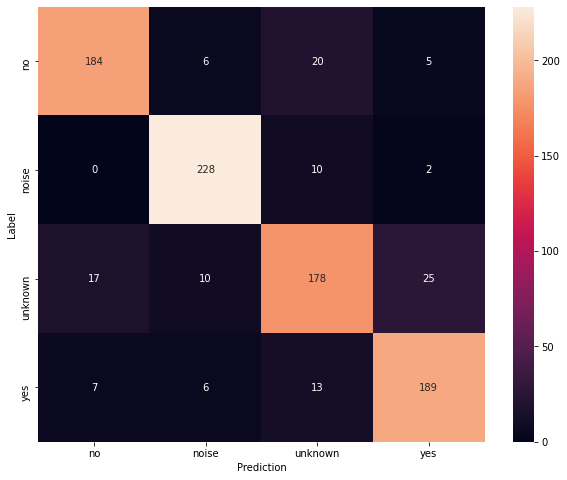

Epoch 4/15
71/71 [==============================] - 74s 1s/step - loss: 0.3592 - accuracy: 0.8807 - val_loss: 0.3751 - val_accuracy: 0.8644
Validation set accuracy: 86%


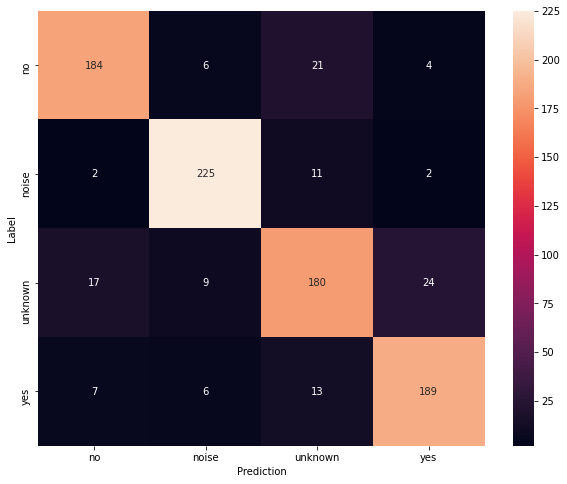

Epoch 5/15
71/71 [==============================] - 74s 1s/step - loss: 0.3560 - accuracy: 0.8818 - val_loss: 0.3748 - val_accuracy: 0.8644
Validation set accuracy: 86%


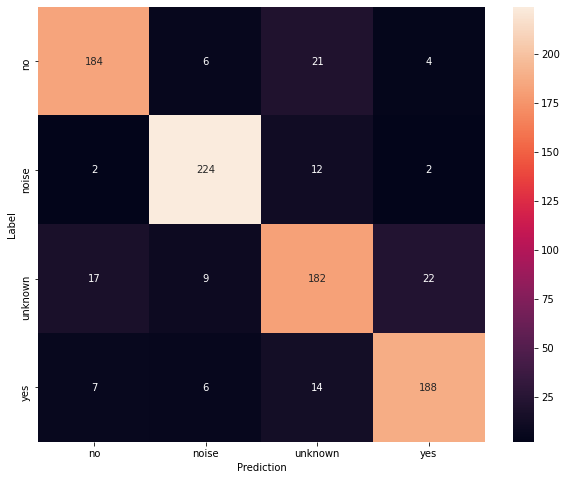

Epoch 6/15
71/71 [==============================] - 74s 1s/step - loss: 0.3436 - accuracy: 0.8882 - val_loss: 0.3746 - val_accuracy: 0.8644
Validation set accuracy: 86%


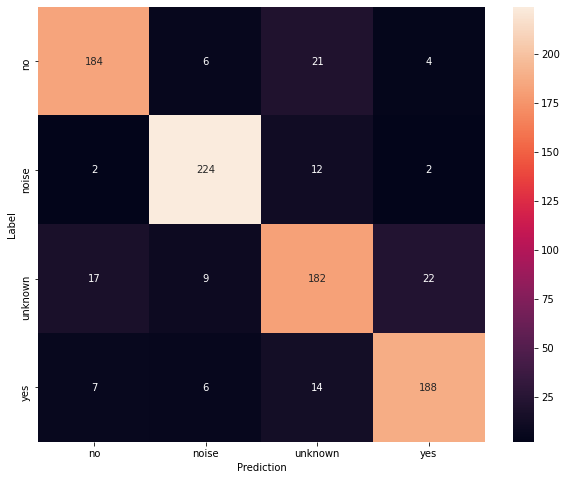

Epoch 7/15
71/71 [==============================] - 74s 1s/step - loss: 0.3467 - accuracy: 0.8864 - val_loss: 0.3745 - val_accuracy: 0.8644
Validation set accuracy: 86%


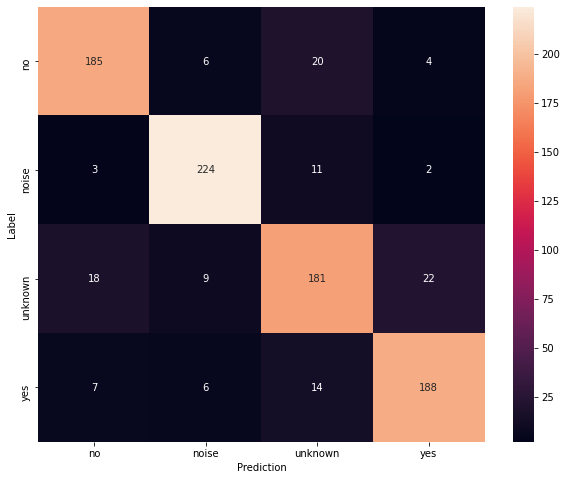

Epoch 8/15
71/71 [==============================] - 74s 1s/step - loss: 0.3716 - accuracy: 0.8742 - val_loss: 0.3743 - val_accuracy: 0.8644
Validation set accuracy: 86%


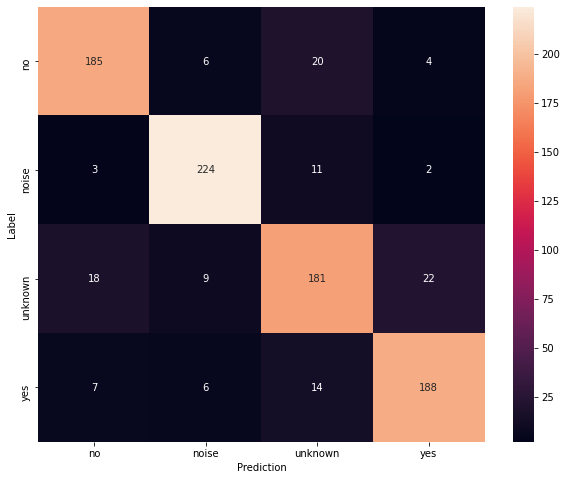

Epoch 9/15
71/71 [==============================] - 74s 1s/step - loss: 0.3751 - accuracy: 0.8773 - val_loss: 0.3742 - val_accuracy: 0.8644


KeyboardInterrupt: ignored

In [ ]:
net.compile(
    optimizer=tf.keras.optimizers.SGD(1e-4),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)
EPOCHS = 15
history_vgg = net.fit( 
    train_ds, 
    validation_data=val_ds,  
    epochs=EPOCHS, callbacks = callbacks_list
)

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

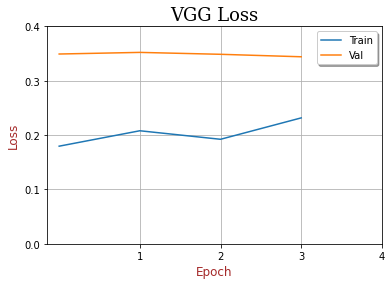

In [ ]:
plt.plot(history_vgg.history['loss'], label = 'Train')
plt.plot(history_vgg.history['val_loss'], label = 'Val')
plt.title('VGG Loss', family = 'serif', fontsize = 18)
plt.ylabel('Loss', color = 'brown', fontsize = 12) 
plt.xlabel('Epoch', color = 'brown', fontsize = 12)
plt.legend(frameon = True, shadow = True)
plt.yticks(np.arange(0,0.5,0.1))
plt.xticks(np.arange(1,5,1))
plt.grid()

In [ ]:
y_pred = np.argmax(net.predict(test_audio), axis=1)
y_true = test_labels

test_acc = sum(y_pred == y_true) / len(y_true)
print(f'Test set accuracy: {test_acc:.0%}')

Test set accuracy: 88%


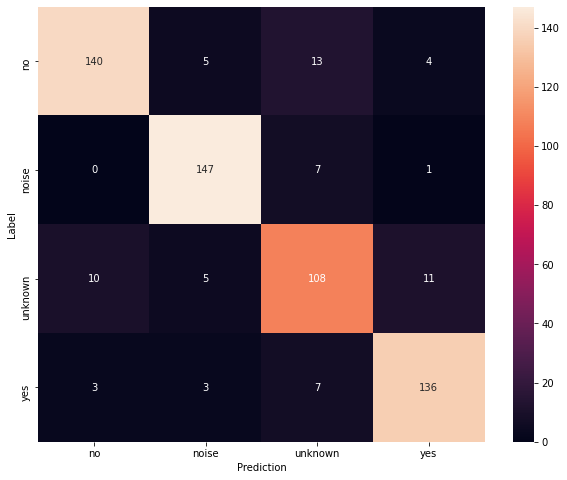

In [ ]:
conf_matr(y_true, y_pred)